In [2]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
sc.logging.print_header()
sc.set_figure_params(facecolor='white', figsize=(8,8))
sc.settings.verbosity = 3

## Reading the data

In [5]:
adata = sc.datasets.visium_sge(sample_id='V1_Human_Lymph_Node')

/tmp/ipykernel_9834/3717292518.py:1: FutureWarning: Use `squidpy.datasets.visium` instead.
  adata = sc.datasets.visium_sge(sample_id='V1_Human_Lymph_Node')


  0%|          | 0.00/7.86M [00:00<?, ?B/s]

  0%|          | 0.00/29.3M [00:00<?, ?B/s]

reading /media/nafiz/NewVolume/ML From Scratch/Spatial Transcriptomics/Scanpy Basics Analysis/data/V1_Human_Lymph_Node/filtered_feature_bc_matrix.h5


/home/nafiz/miniconda3/lib/python3.13/site-packages/scanpy/datasets/_datasets.py:555: FutureWarning: Use `squidpy.read.visium` instead.
  return read_visium(sample_dir, source_image_path=source_image_path)


 (0:00:02)


/home/nafiz/miniconda3/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/nafiz/miniconda3/lib/python3.13/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [6]:
adata.var_names_make_unique()

In [7]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')

In [8]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], inplace=True)

In [9]:
adata

AnnData object with n_obs × n_vars = 4035 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

In [12]:
adata.obs.columns

Index(['in_tissue', 'array_row', 'array_col', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'],
      dtype='object')

## QC and preprocessing

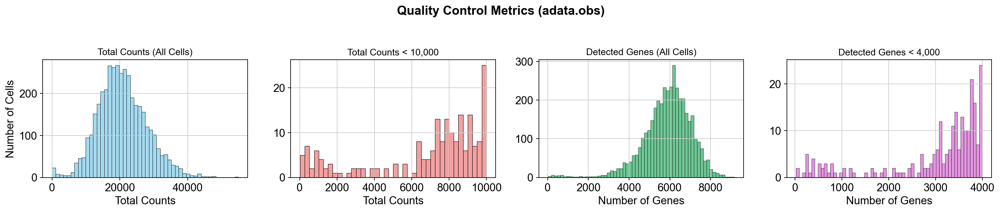

In [13]:
# Create the figure and axes
fig, axs = plt.subplots(1, 4, figsize=(18, 4))
fig.suptitle('Quality Control Metrics (adata.obs)', fontsize=16, weight='bold')

# Plot 1: Total counts (all)
sns.histplot(adata.obs['total_counts'], kde=False, bins=50, ax=axs[0], color='skyblue')
axs[0].set_title('Total Counts (All Cells)', fontsize=12)
axs[0].set_xlabel('Total Counts')
axs[0].set_ylabel('Number of Cells')

# Plot 2: Total counts < 10,000
sns.histplot(adata.obs['total_counts'][adata.obs['total_counts'] < 10000], 
             kde=False, bins=40, ax=axs[1], color='lightcoral')
axs[1].set_title('Total Counts < 10,000', fontsize=12)
axs[1].set_xlabel('Total Counts')
axs[1].set_ylabel('')

# Plot 3: Genes by counts (all)
sns.histplot(adata.obs['n_genes_by_counts'], kde=False, bins=60, ax=axs[2], color='mediumseagreen')
axs[2].set_title('Detected Genes (All Cells)', fontsize=12)
axs[2].set_xlabel('Number of Genes')
axs[2].set_ylabel('')

# Plot 4: Genes by counts < 4,000
sns.histplot(adata.obs['n_genes_by_counts'][adata.obs['n_genes_by_counts'] < 4000], 
             kde=False, bins=60, ax=axs[3], color='orchid')
axs[3].set_title('Detected Genes < 4,000', fontsize=12)
axs[3].set_xlabel('Number of Genes')
axs[3].set_ylabel('')

# Improve layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # leave space for suptitle
plt.show()

In [14]:
sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs['pct_counts_mt'] < 20].copy()
print(f"Cells after MT filter : {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

filtered out 44 cells that have less than 5000 counts
filtered out 130 cells that have more than 35000 counts
Cells after MT filter : 3861
filtered out 16916 genes that are detected in less than 10 cells


In [15]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor='seurat', n_top_genes=2000)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


## Manifold embedding and clustering based on transcriptional similarity

In [17]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata,
            key_added='clusters', flavor='igraph', directed=False, n_iterations=2)

computing PCA
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:07)
running Leiden clustering
    finished: found 10 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


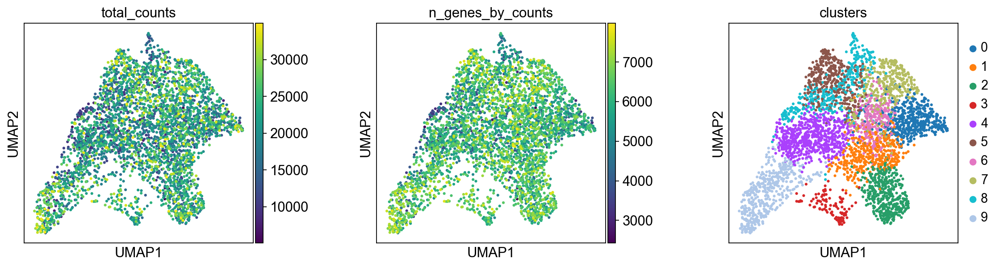

In [18]:
plt.rcParams['figure.figsize'] = (4,4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

## Visualization in spatial coordinates

/tmp/ipykernel_9834/2709366047.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])


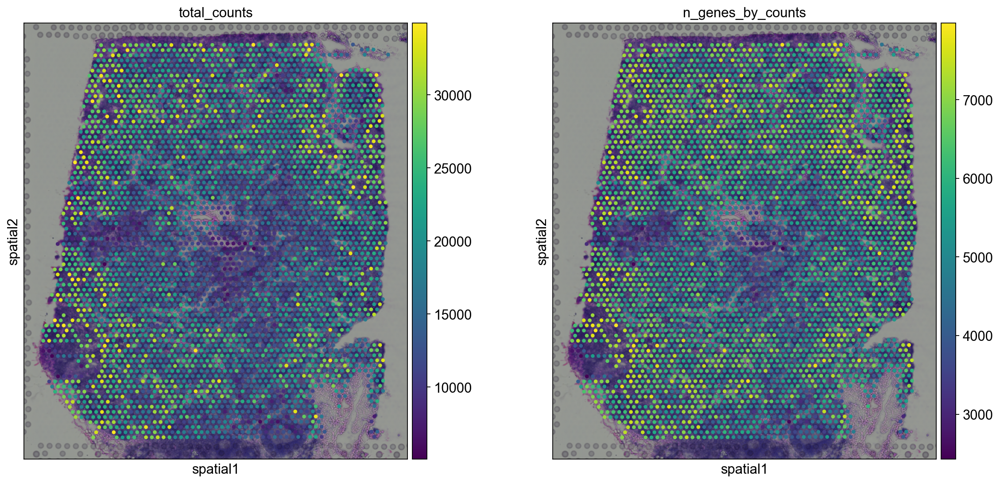

In [19]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

/tmp/ipykernel_9834/4038603402.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key='hires', color='clusters', size=1.5)


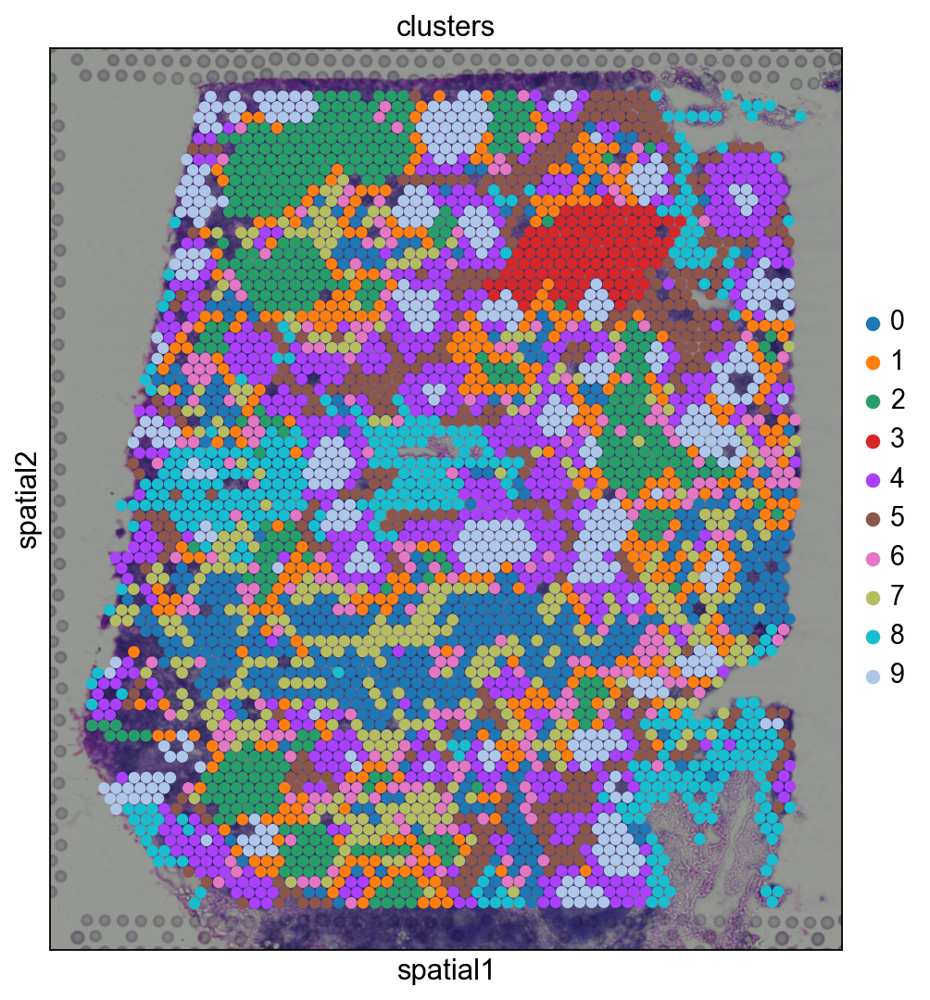

In [20]:
sc.pl.spatial(adata, img_key='hires', color='clusters', size=1.5)

/tmp/ipykernel_9834/2064063084.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


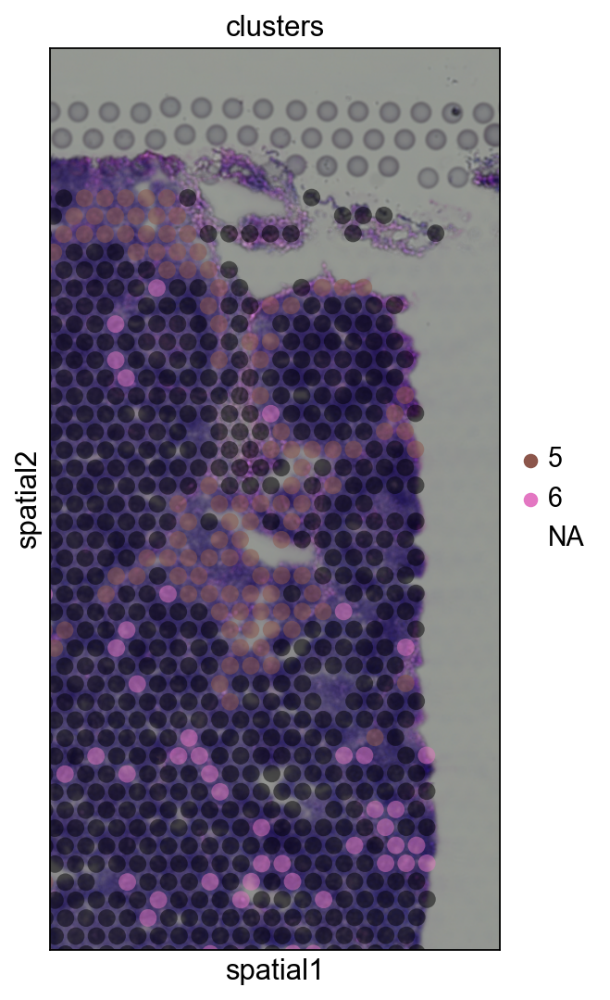

In [21]:
sc.pl.spatial(
    adata,
    img_key='hires',
    color='clusters',
    groups = ['5', '6'],
    crop_coord=[7000, 10000, 0, 6000],
    alpha = 0.5,
    size = 1.3
)

## Cluster marker genes

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clusters']`
categories: 0, 1, 2, etc.
var_group_labels: 9


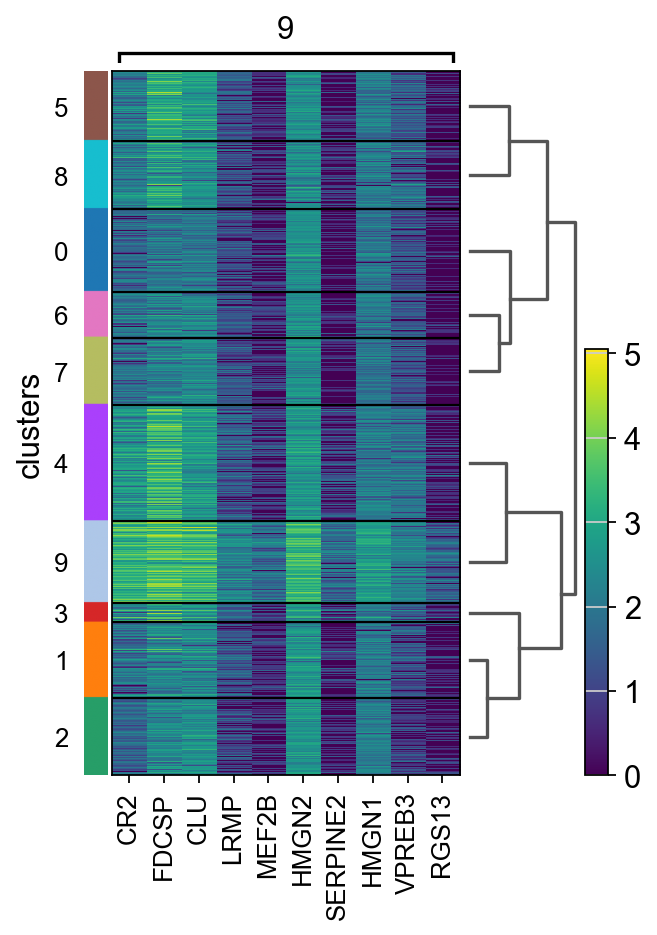

In [22]:
sc.tl.rank_genes_groups(adata, 'clusters', method='t-test')
sc.pl.rank_genes_groups_heatmap(adata, groups='9', n_genes=10, groupby='clusters')

/tmp/ipykernel_9834/32130527.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key='hires', color = ['clusters', 'CR2'])


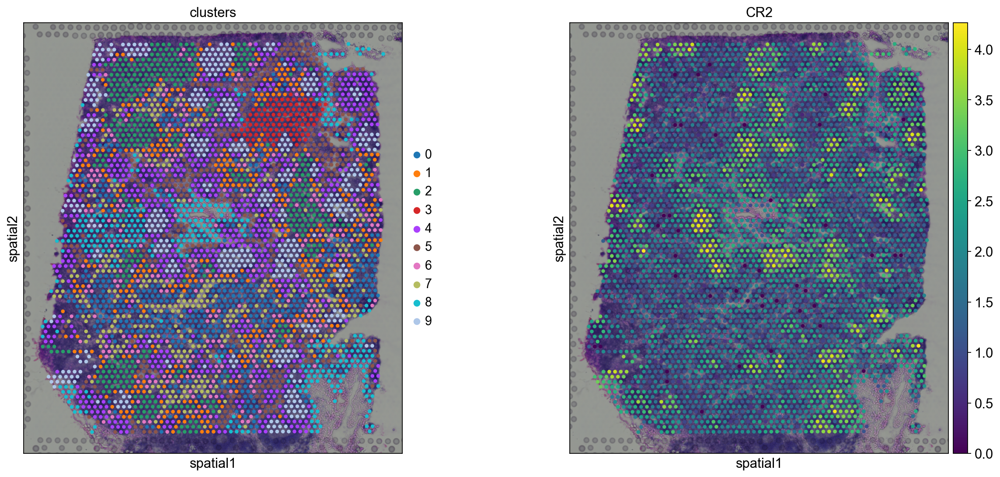

In [24]:
sc.pl.spatial(adata, img_key='hires', color = ['clusters', 'CR2'])

/tmp/ipykernel_9834/989218410.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=["COL1A2", "SYPL1"], alpha=0.7)


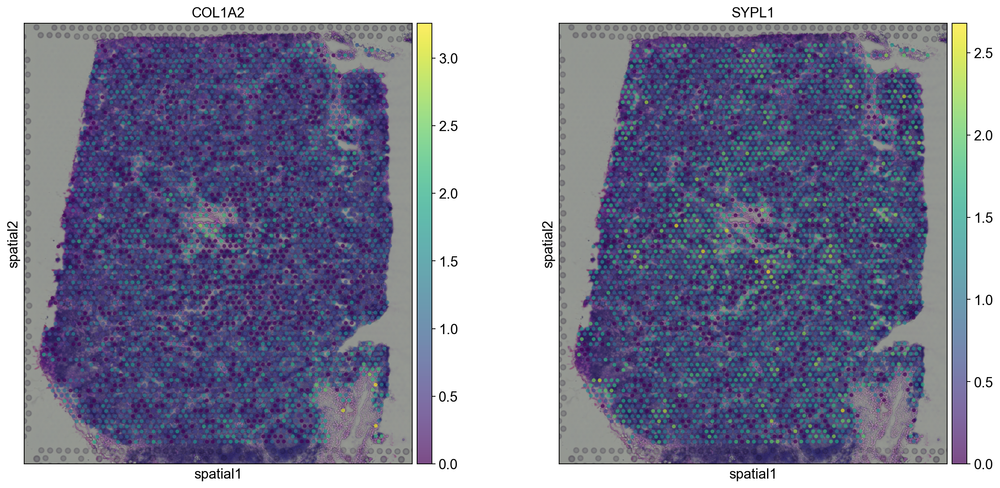

In [26]:
sc.pl.spatial(adata, img_key="hires", color=["COL1A2", "SYPL1"], alpha=0.7)